In [58]:
import numpy as np
import random
import tensorflow as tf
from sklearn.model_selection import train_test_split
from keras.datasets import mnist, cifar10
import matplotlib.pyplot as plt
from skimage.measure import shannon_entropy
from scipy.signal import convolve2d
from abc import abstractmethod
from keras.layers import Input, Conv2D, Dense, Flatten, \
    MaxPooling2D, Softmax
from keras.models import Model, load_model
import time
import math

# Filter array

In [59]:
class Filter:
    def __init__(self, filter_size, filter_type):
        """
        init filter mask with size, type and coefficient
        :param filter_size:
        :param filter_type:
        """
        self.filter_size = filter_size
        self.filter_type = filter_type
        if filter_type == 'cross':
            self.coefficient = filter_size * 2 - 1
        elif filter_type == 'diamond':
            halfSize = filter_size // 2
            self.coefficient = 2 * (halfSize + 2 * (np.sum([x for x in range(halfSize)]))) + filter_size
        elif filter_type == "box":
            self.coefficient = filter_size ** 2

    def get_mask_matrix(self):
        """

        :return: matrix of 0 and 1 for each filter type  (cross, box or diamond)
        """
        filter_matrix = np.zeros((self.filter_size, self.filter_size), dtype=np.int16)
        if self.filter_type == 'cross':
            for i in range(self.filter_size):
                filter_matrix[i][self.filter_size // 2] = 1
            filter_matrix[self.filter_size // 2] = [1]
        elif self.filter_type == "box":
            filter_matrix = np.ones((self.filter_size, self.filter_size), dtype=np.int16)
        else:
            half = self.filter_size // 2
            for i in range(half):
                filter_matrix[i][half] = 1
                filter_matrix[self.filter_size - 1 - i][half] = 1
                if i > 0:
                    for j in range(self.filter_size):
                        if half - i <= j <= half + i:
                            filter_matrix[i][j] = 1
                            filter_matrix[self.filter_size - 1 - i][j] = 1
            filter_matrix[half] = [1]
        return filter_matrix


# Defense function

In [60]:

class DefenderModel:
    def __init__(self, image_size, image_channel):
        self.image_size = image_size
        self.image_channel = image_channel

    def normalization(self, image):
        image[image < 0] = 0
        image[image > 1.0] = 1.0

    def scalarQuantization(self, images, interval):
        """

        :param image: input image
        :param interval:  number of interval
        :param left:
        :return:
        """
        images = images * 255
        images_data = np.array(images, dtype=np.float32)
        images_data //= interval
        images_data *= interval
        images_data /= 255.0
        return images_data

    def entropy(self, image):
        p = np.array([(image==v).sum() for v in range(256)])
        p = p/p.sum()

        # compute entropy
        e = -(p[p>0]*np.log2(p[p>0])).sum()
        return e

    def caculateEntropy(self, image):
        return shannon_entropy(image)
    def oneDEntropy(self, inputDigit):
        expandDigit = np.array((inputDigit-0.5)*255,dtype=np.int16)
        f1 = np.zeros(256)
        f2 = np.zeros(256)
        f3 = np.zeros(256)
        for i in range(32):
            for j in range(32):
                f1[expandDigit[i][j][0]]+=1
                f2[expandDigit[i][j][1]]+=1
                f3[expandDigit[i][j][2]]+=1
        f1/=1024.0
        f2/=1024.0
        f3/=1024.0
        H1 = 0
        H2 = 0
        H3 = 0
        for i in range(256):
            if f1[i] > 0:
                H1+=f1[i]*math.log(f1[i],2)
            if f2[i] > 0:
                H2+=f2[i]*math.log(f2[i],2)
            if f3[i] > 0:
                H3+=f3[i]*math.log(f3[i],2)
        return -(H1+H2+H3)/3.0

    def caculateEntropyBatch(self, images, batch_size):
        entropys = []
        for image in images:
          entropys.append(shannon_entropy(image))
        return np.array(entropys)

    def chooseCloserFilter(self, origin_image, filter1_image, filter2_image):
        """
        :param origin_image: origin
        :param filter1_image: output of filter1
        :param filter2_image: output of filter2
        :return:
        """
        distance1 = np.absolute(filter1_image - origin_image)
        distance2 = np.absolute(filter2_image - origin_image)
        result = filter1_image
        #smaller_index
        # smaller_index = np.where(distance1 > distance2)
        # result[smaller_index] = filter2_image[smaller_index]

        # bigger_index
        # bigger_index = np.where(distance1 < distance2)
        # result[bigger_index] = filter2_image[bigger_index]
        result = (filter1_image + filter2_image) / 2
        return result

    def MeanFilter(self, input_image, filter_size, type_filter):
        """
        :param input_image:
        :param filter_size:
        :param type_filter: type of filter (box, cross or diamond)
        :return:
        """
        image = np.array(input_image, dtype=np.float32)
        if type_filter == 'diamond':
            kernel_matrix = Filter(filter_size, "diamond")
        elif type_filter == "box":
            kernel_matrix = Filter(filter_size, "box")
        else:
            kernel_matrix = Filter(filter_size, "cross")
        for channel in range(self.image_channel):
            image[channel, :] = convolve2d(image[channel, :], kernel_matrix.get_mask_matrix(), mode='same')
            image[channel, :] = image[channel, :] / kernel_matrix.coefficient
        return image

    def MeanFilterBatch(self, images, filter_size, type_filter):
        kernel_core = Filter(filter_size, type_filter).get_mask_matrix()
        kernel = np.array([kernel_core, kernel_core, kernel_core])
        print(kernel.shape)
        return tf.nn.conv2d(input=images, filters=np.array(kernel).reshape((filter_size,filter_size,3,1)), strides=1,padding="SAME")
        # return tf.nn.conv2d(input=images, filters=kernel.reshape((filter_size,filter_size,3,1)), strides=1,padding="SAME")
    



# Classifier model

In [61]:


class AbstractClassifier:
    """
    Abstract Classifier
    """

    def __init__(self, save_path, pretrained=True):
        """

        :param save_path: folder path to save classifier
        :param pretrained: set True to use load to load pretrained models
        """
        self.save_path = save_path
        self.classifier = None
        if not pretrained:
            self.build()
            self.compile()

    @abstractmethod
    def build(self):
        """
        Build Model.
        :return: None
        """
        pass

    def compile(self):
        """
        Compile model
        :return:  None
        """
        self.classifier.compile(optimizer='adam', loss="mse", metrics=['accuracy'])

    def train(self, epochs=50, batch_size=32, save_name='classifier.h5'):
        """

        :param epochs: epochs to train classifier.
        :param batch_size:
        :param save_name:
        :return:
        """
        x_train, y_train, x_val, y_val, x_test, y_test = data_preprocessing_mnist(0.2)
        self.classifier.fit(x_train, y_train, batch_size=batch_size, validation_data=(x_val, y_val), epochs=epochs)

        if save_name is not None:
            self.classifier.save(os.path.join(self.save_path, save_name))

    def load(self, save_name="classifier.h5", save_path=None):
        """

        :param save_name:
        :param save_path:
        :return:
        """
        if save_path is None:
            save_path = self.save_path

        path = os.path.join(save_path, save_name)
        self.classifier = load_model(path)

    def evaluate(self, data, label):
        """

        :param data:
        :param label:
        :return:
        """
        return self.classifier.evaluate(data, label)


class AlexnetClassifier(AbstractClassifier):
    """

    """

    def build(self):
        input_layer = Input(shape=(28, 28, 1))

        x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', padding='same')(input_layer)
        x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', padding='same')(x)
        x = MaxPooling2D(pool_size=(2, 2))(x)
        x = Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same')(x)
        x = Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same')(x)
        x = MaxPooling2D(pool_size=(2, 2))(x)
        x = Flatten()(x)
        x = Dense(units=200)(x)
        x = Dense(units=200)(x)
        x = Dense(units=10)(x)
        output_layer = Softmax(name='softmax_output')(x)

        self.classifier = Model(input_layer, output_layer, name="decoder")


# Helper function

In [62]:


def data_preprocessing_mnist(val_ratio):
    (x_train_all, y_train_all), (x_test, y_test) = mnist.load_data()
    x_train_all = x_train_all.reshape((x_train_all.shape[0], 28, 28, 1))

    x_test = x_test.reshape((x_test.shape[0], 28, 28, 1))
    x_train_all = x_train_all.astype('float32') / 255.0
    x_test = x_test.astype('float32') / 255.0

    y_train_all = tf.keras.utils.to_categorical(y_train_all, 10)
    y_test = tf.keras.utils.to_categorical(y_test)

    x_train, x_val, y_train, y_val = train_test_split(x_train_all, y_train_all, test_size=val_ratio)
    return (x_train, y_train), (x_val, y_val), (x_test, y_test)


def data_preprocessing_cifar10(val_ratio):
    (x_train_all, y_train_all), (x_test, y_test) = cifar10.load_data()
    x_train_all = x_train_all.reshape((x_train_all.shape[0], 32, 32, 3))

    x_test = x_test.reshape((x_test.shape[0], 32, 32, 3))
    x_train_all = x_train_all.astype('float32') / 255.0
    x_test = x_test.astype('float32') / 255.0

    y_train_all = tf.keras.utils.to_categorical(y_train_all, 10)
    y_test = tf.keras.utils.to_categorical(y_test, 10)

    x_train, x_val, y_train, y_val = train_test_split(x_train_all, y_train_all, test_size=val_ratio)
    return (x_train, y_train), (x_val, y_val), (x_test, y_test)


def shuffle_data(origin_data, origin_label, adv_data, adv_label):
    all_data = []
    for i in range(len(origin_label)):
        temp = [origin_label[i], origin_data[i], 0]
        all_data.append(temp)
    for i in range(len(adv_label)):
        temp = [adv_label[i], adv_data[i], 1]
        all_data.append(temp)
    random.shuffle(all_data)
    data_all_shuffle = np.array(all_data, dtype=object)
    data_train = data_all_shuffle[:, 1]
    label_train = data_all_shuffle[:, 0]
    is_adv = data_all_shuffle[:, 2]
    train_data = []
    for data in data_train:
        train_data.append(np.array(data))
    return np.array(train_data), label_train, is_adv

def plot_image(images, save_name):
    plt.figure(figsize=(10, 10))
    start_index = 0
    for i in range(100):
        plt.subplot(10, 10, i + 1)
        plt.grid(False)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(images[start_index + i])
    plt.savefig(save_name + '.png')

# Test

In [63]:

def get_output_image(image, detectorFilter):
    image_reshape = np.reshape(image,
                               (detectorFilter.image_channel, detectorFilter.image_size, detectorFilter.image_size))
    imageEntropy = detectorFilter.caculateEntropy(image_reshape)
    if imageEntropy < 4:
        current_image_res = detectorFilter.scalarQuantization(image_reshape, 128)
    elif imageEntropy < 5:
        current_image_res = detectorFilter.scalarQuantization(image_reshape, 64)
    else:
        current_image_ASQ = detectorFilter.scalarQuantization(image_reshape,8)
        current_image_crossMean = detectorFilter.MeanFilter(current_image_ASQ, 19, 'cross')
        current_image_res = detectorFilter.chooseCloserFilter(imageEntropy, current_image_ASQ,
                                                              current_image_crossMean)
        # print(abs(image_reshape - current_image_ASQ))
    current_x_res = np.reshape(current_image_res,
                               (detectorFilter.image_size, detectorFilter.image_size, detectorFilter.image_channel))
    return current_x_res

def get_output_image_batch(images, detectorFilter, batch_size):
    # images_reshape = np.reshape(images, (batch_size,detectorFilter.image_channel, detectorFilter.image_size, detectorFilter.image_size))
    images_reshape = images
    image_entropys = detectorFilter.caculateEntropyBatch(images_reshape, batch_size)
    entropy_4_idx = np.where(image_entropys < 4)
    entropy_5_idx = np.where((image_entropys == 4) | ((image_entropys > 4) & (image_entropys < 5)))
    entropy_idx = np.where((image_entropys == 5) | (image_entropys > 5))
    current_image_res = images_reshape
    current_image_crossMean = images_reshape
    if entropy_4_idx[0].size != 0:
      current_image_res[entropy_4_idx] = detectorFilter.scalarQuantization(current_image_res[entropy_4_idx], 128)
    if entropy_5_idx[0].size != 0:
      current_image_res[entropy_5_idx] = detectorFilter.scalarQuantization(current_image_res[entropy_5_idx], 64)
    if entropy_idx[0].size != 0:
      current_image_res[entropy_idx] = detectorFilter.scalarQuantization(current_image_res[entropy_idx], 43)
      current_image_crossMean[entropy_idx] = detectorFilter.MeanFilterBatch(current_image_res[entropy_idx],13,'cross')
      distance1 = np.absolute(current_image_res[entropy_idx] - images_reshape[entropy_idx])
      distance2 = np.absolute(current_image_crossMean[entropy_idx] - images_reshape[entropy_idx])
      print(distance1[entropy_idx] == 0.0)
      print(distance2)
      smaller_index = np.where(distance1 > distance2)
      print(smaller_index)
      current_image_res[smaller_index] = current_image_crossMean[smaller_index]
    current_image_res = np.reshape(current_image_res,(batch_size,detectorFilter.image_size, detectorFilter.image_size,detectorFilter.image_channel) )
    return current_image_res

# Main

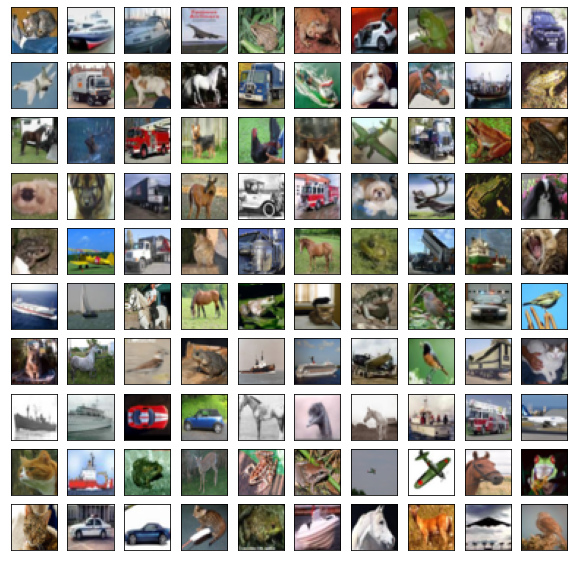

In [64]:
cifar10_classifier = tf.keras.models.load_model('./models/cifar10_classifier')
(x_train, y_train), (x_val, y_val), (x_test, y_test) = data_preprocessing_cifar10(0.1)

origin_data_idx = np.load('./data/cifar_origin_data_idx.npy')
origin_data = x_test[origin_data_idx]
origin_label = y_test[origin_data_idx]
plot_image(origin_data, "origin_image")

In [65]:
defender = DefenderModel(32, 3)

In [66]:
adv_data_idx = np.load('./data/cifar_adv_idx/cifar_cw_l2_20_idx.npy')
adv_data = np.load('./data/cifar_adv/cifar_cw_l2_20.npy')
adv_data = adv_data[adv_data_idx]
adv_label = y_test[origin_data_idx][adv_data_idx]
loss, acc = cifar10_classifier.evaluate(adv_data, adv_label)

282/282 [==============================] - 9s 31ms/step - loss: 4.8300 - accuracy: 0.0000e+00


282/282 [==============================] - 10s 35ms/step - loss: 0.3276 - accuracy: 0.9103


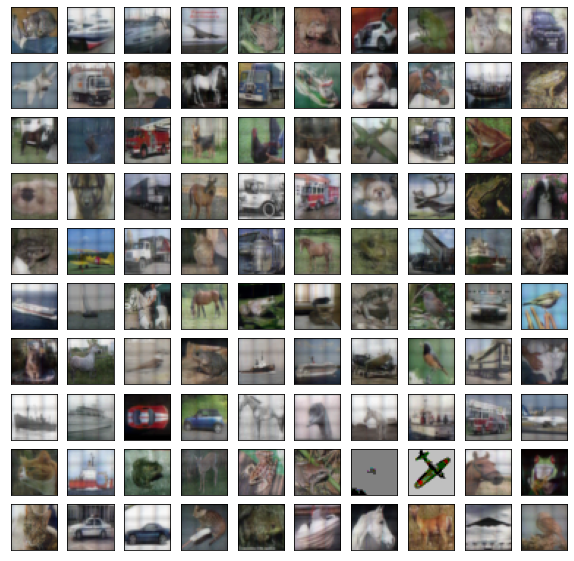

In [67]:
origin_images = []
for i in range(len(origin_data)):
  image = get_output_image(origin_data[i], defender)
  origin_images.append(image)
origin_images = np.array(origin_images)
cifar10_classifier.evaluate(origin_images, origin_label)
plot_image(origin_images, "origin_cleaned_config_7_average_distance")

104/104 [==============================] - 3s 32ms/step - loss: 2.0306 - accuracy: 0.5551


C:\Users\vuot2\AppData\Local\Temp\ipykernel_6056\589441262.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10, 10))


281/281 [==============================] - 11s 37ms/step - loss: 26.5743 - accuracy: 0.0211


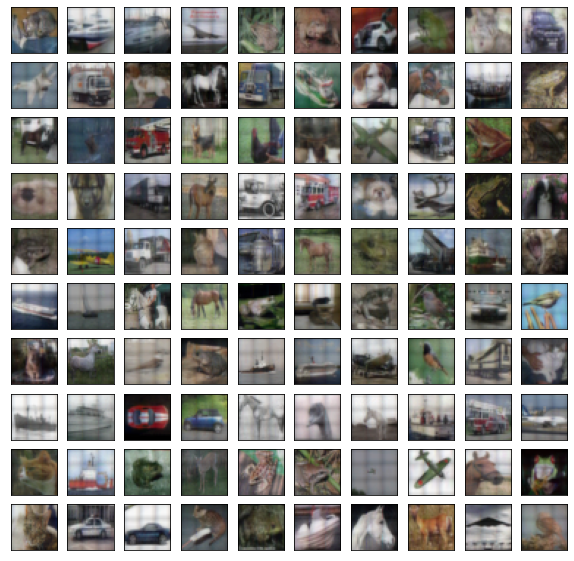

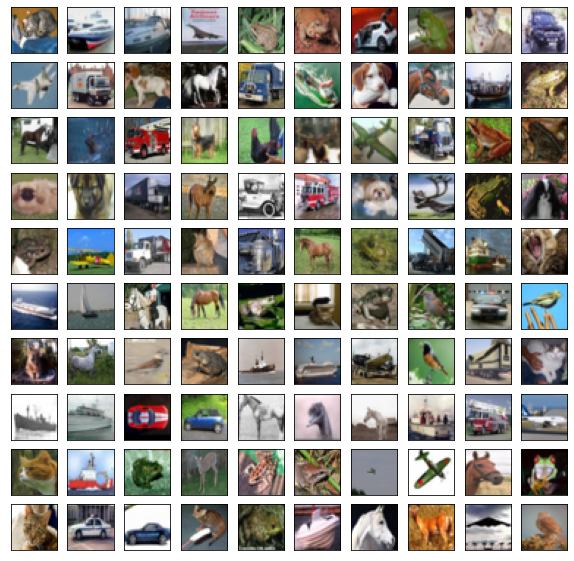

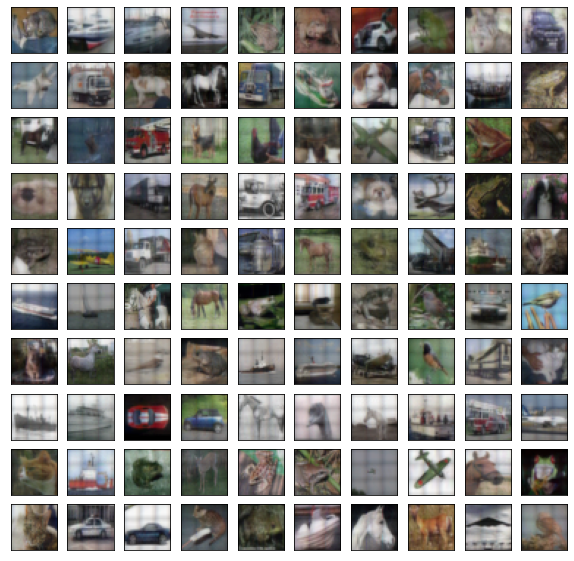

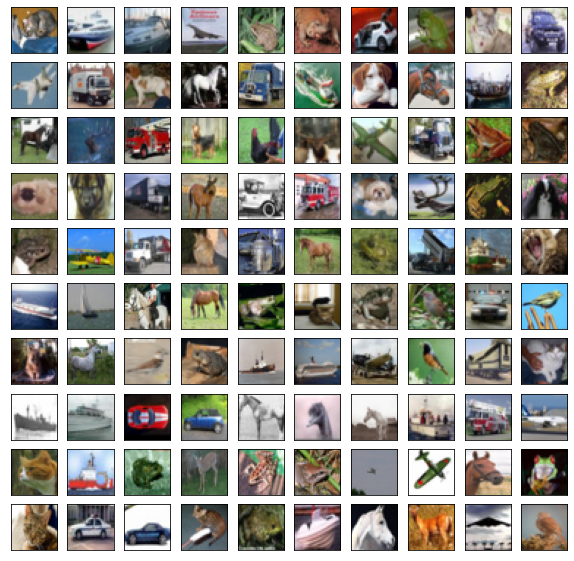

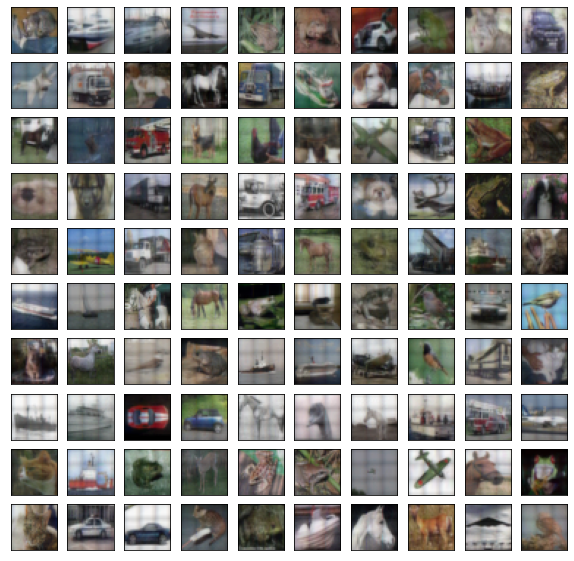

...

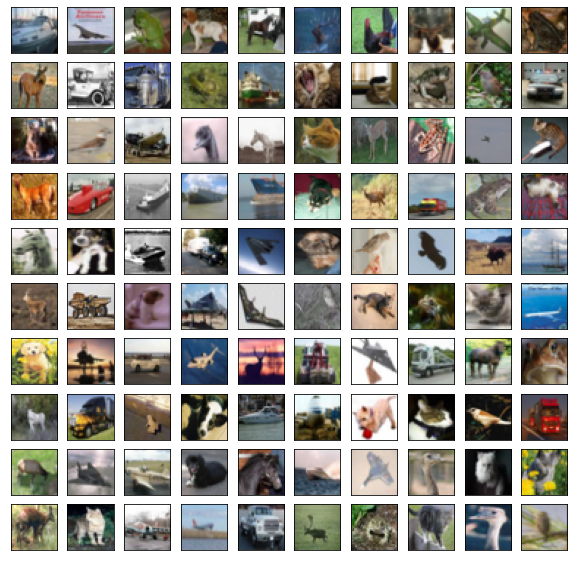

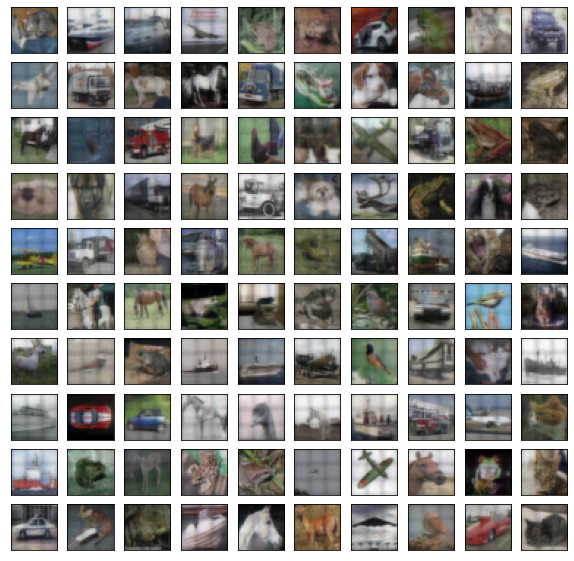

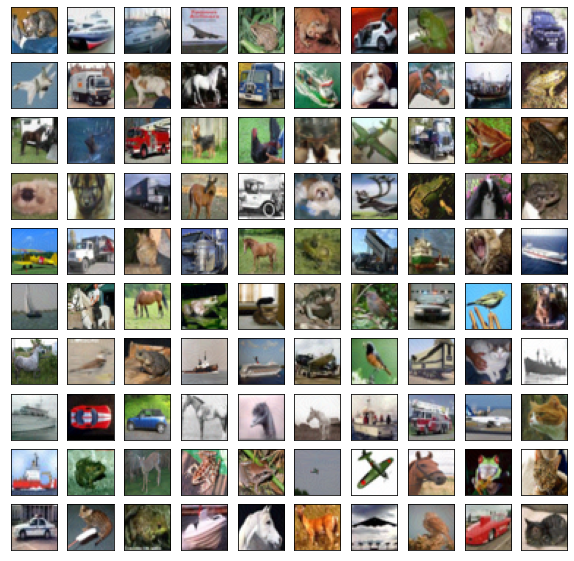

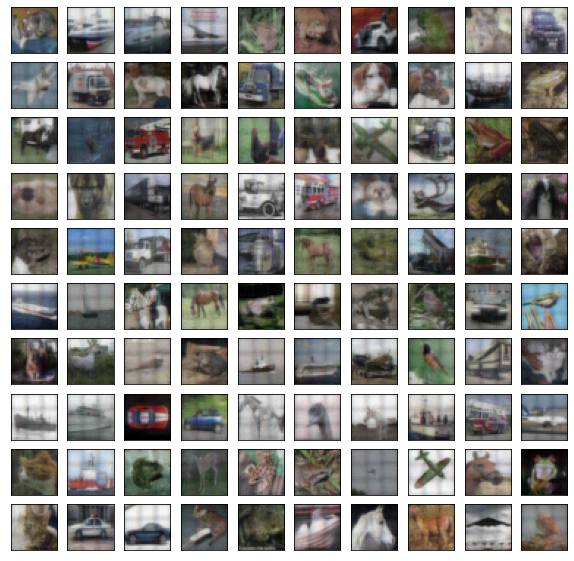

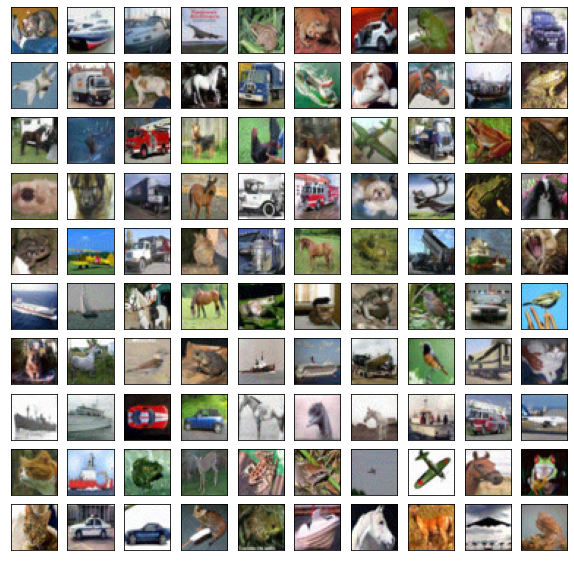

In [68]:
results = []
file = open("adv_list.txt","r")
advs = file.readlines()
for adv in advs:
    adv_data_idx = np.load('./data/cifar_adv_idx/' + adv.strip() + '_idx.npy')
    adv_data = np.load('./data/cifar_adv/' + adv.strip() + '.npy')
    adv_data = adv_data[adv_data_idx]
    adv_label = y_test[origin_data_idx][adv_data_idx]
    loss, acc = cifar10_classifier.evaluate(adv_data, adv_label)

    images = []
    for i in range(len(adv_data)):
      image = get_output_image(adv_data[i], defender)
      images.append(image)
    images = np.array(images)
    loss, acc_clear = cifar10_classifier.evaluate(images, adv_label)
    result = {
        "type of adv": adv.strip(),
        "number of adv": len(adv_data),
        "adv non clean accuracy": acc,
        "adv clean accuracy": acc_clear,
    }
    results.append(result)
    plot_image(images, adv.strip() + '_config_average_distance_best_for_origin')
    plot_image(adv_data, adv.strip() + '_config_cleaned_average_distance_best_for_origin')


In [69]:
import json
with open("result.json", "a") as outfile:
    json.dump(results, outfile, indent=2)

In [70]:
res = json.dumps(results, indent=2)
print(res)

[
  {
    "type of adv": "cifar_cw_l2_00",
    "number of adv": 9012,
    "adv non clean accuracy": 0.0,
    "adv clean accuracy": 0.8194629549980164
  },
  {
    "type of adv": "cifar_cw_l2_10",
    "number of adv": 9012,
    "adv non clean accuracy": 0.0,
    "adv clean accuracy": 0.7401242852210999
  },
  {
    "type of adv": "cifar_cw_l2_20",
    "number of adv": 9012,
    "adv non clean accuracy": 0.0,
    "adv clean accuracy": 0.7461162805557251
  },
  {
    "type of adv": "cifar_cw_l2_30",
    "number of adv": 9012,
    "adv non clean accuracy": 0.0,
    "adv clean accuracy": 0.7557700872421265
  },
  {
    "type of adv": "cifar_cw_l2_40",
    "number of adv": 9012,
    "adv non clean accuracy": 0.0,
    "adv clean accuracy": 0.7598757147789001
  },
  {
    "type of adv": "cifar_fgsm_l2_0_250",
    "number of adv": 4770,
    "adv non clean accuracy": 0.0,
    "adv clean accuracy": 0.3991614282131195
  },
  {
    "type of adv": "cifar_fgsm_l2_0_500",
    "number of adv": 5358,
  